## 1. Configuration & Control Variables

In [1]:
# Control variable: Set to True to skip training and only load/visualize existing results
# Useful for viewing history, plotting curves, or running inference without training
SKIP_TRAINING = False  # Set to True to skip the training loop

# Telegram notifications configuration
telegram_config = {
    "notify_every": 0,  # Send notification every N epochs (0 to disable)
    "model_name": "Pix2Pix GAN",
    "degradation_info": {
        "type": "Gaussian Noise",
        "description": "Additive white Gaussian noise",
        "settings": {
            "Sigma": 25,
            "Mean": 0.0,
            "Std deviation": 0.1,
            "Distribution": "Normal (Gaussian)",
        },
    },
}

## 2. Imports

In [2]:
import warnings
from pathlib import Path
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.cuda.amp import GradScaler
from torch.utils.tensorboard import SummaryWriter
import matplotlib.pyplot as plt
import cv2
from tqdm import tqdm
import json

from src.degradations.generate_degraded_dataset import generate_degraded_dataset
from src.models.pix2pix import Pix2PixGenerator, PatchGANDiscriminator
from src.training import get_dataloaders
from src.training.training_pix2pix import train_epoch_pix2pix, validate_pix2pix
from src.utils import (
    get_degraded_data_dir,
    get_raw_data_dir,
    plot_image_comparison,
    plot_inference_results,
    download_div2k_dataset,
    get_model_experiments_dir,
    setup_or_resume_experiment,
    resume_training,
)
from src.evaluation import ImageRestorationEvaluator

warnings.filterwarnings("ignore")

print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"CUDA device: {torch.cuda.get_device_name(0)}")
    print(f"CUDA memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.2f} GB")

PyTorch version: 2.9.1+cu130
CUDA available: True
CUDA device: NVIDIA GeForce RTX 3070
CUDA memory: 8.59 GB


## 3. Training Configuration

In [3]:
# Training configuration for Pix2Pix GAN
config = {
    # Data paths
    "train_degraded_dir": str(get_degraded_data_dir() / "gaussian" / "DIV2K_train_HR"),
    "train_clean_dir": str(get_raw_data_dir() / "DIV2K_train_HR"),
    "val_degraded_dir": str(get_degraded_data_dir() / "gaussian" / "DIV2K_valid_HR"),
    "val_clean_dir": str(get_raw_data_dir() / "DIV2K_valid_HR"),
    
    # Training hyperparameters
    "batch_size": 16,  # Smaller batch size for GAN (more stable)
    "num_epochs": 100,
    "learning_rate_G": 2e-4,  # Generator learning rate
    "learning_rate_D": 2e-4,  # Discriminator learning rate
    "beta1": 0.5,  # Adam beta1 (momentum)
    "beta2": 0.999,  # Adam beta2
    
    # Loss weights
    "lambda_L1": 100.0,  # Weight for L1 loss (pixel-wise reconstruction)
    
    # Data augmentation
    "patch_size": 256,  # Pix2Pix works better with larger patches
    "patches_per_image": 8,
    "num_workers": 4,
    
    # Model architecture
    "generator_features": 64,
    "discriminator_features": 64,
    
    # Degradation
    "noise_sigma": 100.0,  # Gaussian noise standard deviation
    
    # Training stability
    "patience": 7,  # Early stopping patience
    "save_every": 5,  # Save checkpoint every N epochs
    "val_every": 1,  # Validate every N epochs
    
    # Mixed precision
    "use_amp": True,  # Automatic mixed precision
    
    # Resume training
    "resume_from_checkpoint": False,  # Set to True to resume from existing checkpoint
    "resume_experiment": "latest",  # Path to experiment directory to resume (e.g., "experiments/pix2pix/gaussian/pix2pix_gaussian_20260103_123238")
    
    # Device
    "device": "cuda" if torch.cuda.is_available() else "cpu",
    "seed": 42,
}

# Set seed for reproducibility
torch.manual_seed(config["seed"])
np.random.seed(config["seed"])
if torch.cuda.is_available():
    torch.cuda.manual_seed(config["seed"])
    torch.backends.cudnn.deterministic = False
    torch.backends.cudnn.benchmark = True

print("\n📋 Pix2Pix Configuration:")
for key, value in config.items():
    print(f"   {key}: {value}")


📋 Pix2Pix Configuration:
   train_degraded_dir: c:\Development\Deep Learning\Progetto 1\Image-Enhancement\data\degraded\gaussian\DIV2K_train_HR
   train_clean_dir: c:\Development\Deep Learning\Progetto 1\Image-Enhancement\data\raw\DIV2K_train_HR
   val_degraded_dir: c:\Development\Deep Learning\Progetto 1\Image-Enhancement\data\degraded\gaussian\DIV2K_valid_HR
   val_clean_dir: c:\Development\Deep Learning\Progetto 1\Image-Enhancement\data\raw\DIV2K_valid_HR
   batch_size: 16
   num_epochs: 100
   learning_rate_G: 0.0002
   learning_rate_D: 0.0002
   beta1: 0.5
   beta2: 0.999
   lambda_L1: 100.0
   patch_size: 256
   patches_per_image: 8
   num_workers: 4
   generator_features: 64
   discriminator_features: 64
   noise_sigma: 100.0
   patience: 7
   save_every: 5
   val_every: 1
   use_amp: True
   resume_from_checkpoint: False
   resume_experiment: latest
   device: cuda
   seed: 42


## 4. Setup Experiment Directories

In [4]:
# Setup or resume experiment
exp_dir, checkpoints_dir, samples_dir, logs_dir = setup_or_resume_experiment(
    model_name="pix2pix",
    degradation="gaussian",
    config=config,
    resume_from_checkpoint=config["resume_experiment"] if config["resume_from_checkpoint"] else None,
)

print(f"\n📁 Experiment directory: {exp_dir}")
print(f"   Checkpoints: {checkpoints_dir}")
print(f"   Samples: {samples_dir}")
print(f"   Logs: {logs_dir}")


📁 Experiment: 20260103_163829

📁 Experiment directory: c:\Development\Deep Learning\Progetto 1\Image-Enhancement\experiments\pix2pix\gaussian\20260103_163829
   Checkpoints: c:\Development\Deep Learning\Progetto 1\Image-Enhancement\experiments\pix2pix\gaussian\20260103_163829\checkpoints
   Samples: c:\Development\Deep Learning\Progetto 1\Image-Enhancement\experiments\pix2pix\gaussian\20260103_163829\samples
   Logs: c:\Development\Deep Learning\Progetto 1\Image-Enhancement\experiments\pix2pix\gaussian\20260103_163829\logs


## 5. Setup TensorBoard

In [5]:
# TensorBoard writer
writer = SummaryWriter(log_dir=logs_dir)

print(f"\n📊 TensorBoard logs: {logs_dir}")
print(f"   Run: tensorboard --logdir {logs_dir.absolute()}")


📊 TensorBoard logs: c:\Development\Deep Learning\Progetto 1\Image-Enhancement\experiments\pix2pix\gaussian\20260103_163829\logs
   Run: tensorboard --logdir c:\Development\Deep Learning\Progetto 1\Image-Enhancement\experiments\pix2pix\gaussian\20260103_163829\logs


## 6. Generate Degraded Datasets

Generate corrupted versions of DIV2K images using Gaussian noise with sigma=25

In [6]:
# Check if raw datasets exist, if not download them
train_clean_exists = Path(config["train_clean_dir"]).exists()
val_clean_exists = Path(config["val_clean_dir"]).exists()

if not train_clean_exists or not val_clean_exists:
    print("=" * 80)
    print("📥 DIV2K Dataset Not Found - Downloading...")
    print("=" * 80)
    download_div2k_dataset()
else:
    print("✅ DIV2K raw dataset already exists")

# Check if degraded datasets already exist
train_degraded_exists = Path(config["train_degraded_dir"]).exists()
val_degraded_exists = Path(config["val_degraded_dir"]).exists()

if train_degraded_exists and val_degraded_exists:
    n_train = len(list(Path(config["train_degraded_dir"]).glob("*.png")))
    n_val = len(list(Path(config["val_degraded_dir"]).glob("*.png")))
    print("✅ Degraded datasets already exist:")
    print(f"   Train: {n_train} images in {config['train_degraded_dir']}")
    print(f"   Val: {n_val} images in {config['val_degraded_dir']}")
    print("\n⏭️  Skipping generation (delete folders to regenerate)")
else:
    print("=" * 80)
    print("🎨 Generating Degraded Datasets")
    print("=" * 80)
    print(f"\nDegradation: Gaussian noise (sigma={config['noise_sigma']})")
    print("This will create corrupted versions of DIV2K images\n")

    # Generate training dataset
    if not train_degraded_exists:
        print("📂 Training Dataset")
        generate_degraded_dataset(
            input_dir=config["train_clean_dir"],
            output_dir=config["train_degraded_dir"],
            degradation_type="gaussian_noise",
            noise_sigma=config["noise_sigma"],
            seed=config["seed"],
        )

    # Generate validation dataset
    if not val_degraded_exists:
        print("📂 Validation Dataset")
        generate_degraded_dataset(
            input_dir=config["val_clean_dir"],
            output_dir=config["val_degraded_dir"],
            degradation_type="gaussian_noise",
            noise_sigma=config["noise_sigma"],
            seed=config["seed"],
        )

    print("=" * 80)
    print("✅ Degraded datasets generated successfully!")
    print("=" * 80)

✅ DIV2K raw dataset already exists
✅ Degraded datasets already exist:
   Train: 800 images in c:\Development\Deep Learning\Progetto 1\Image-Enhancement\data\degraded\gaussian\DIV2K_train_HR
   Val: 100 images in c:\Development\Deep Learning\Progetto 1\Image-Enhancement\data\degraded\gaussian\DIV2K_valid_HR

⏭️  Skipping generation (delete folders to regenerate)


## 7. Create Dataloaders

In [7]:
# Create dataloaders
train_loader, val_loader = get_dataloaders(
    train_degraded_dir=config["train_degraded_dir"],
    train_clean_dir=config["train_clean_dir"],
    val_degraded_dir=config["val_degraded_dir"],
    val_clean_dir=config["val_clean_dir"],
    batch_size=config["batch_size"],
    patch_size=config["patch_size"],
    patches_per_image=config["patches_per_image"],
    num_workers=config["num_workers"],
)

print(f"\n📦 Dataloaders created:")
print(f"   Batches per epoch: {len(train_loader)} train, {len(val_loader)} val")
print(f"   Total training samples: {len(train_loader.dataset)}")
print(f"   Total validation samples: {len(val_loader.dataset)}")

Loaded 800 valid images for train set
Loaded 100 valid images for val set
📊 Dataset Summary:
   Train: 6400 patches from 800 images
   Val:   800 patches from 100 images
   Batch size: 16
   Patch size: 256x256

📦 Dataloaders created:
   Batches per epoch: 400 train, 50 val
   Total training samples: 6400
   Total validation samples: 800


## 8. Visualize Sample Batch

📸 Batch shapes:
   Degraded: torch.Size([16, 3, 256, 256])
   Clean: torch.Size([16, 3, 256, 256])
   Range: [-1.000, 1.000]


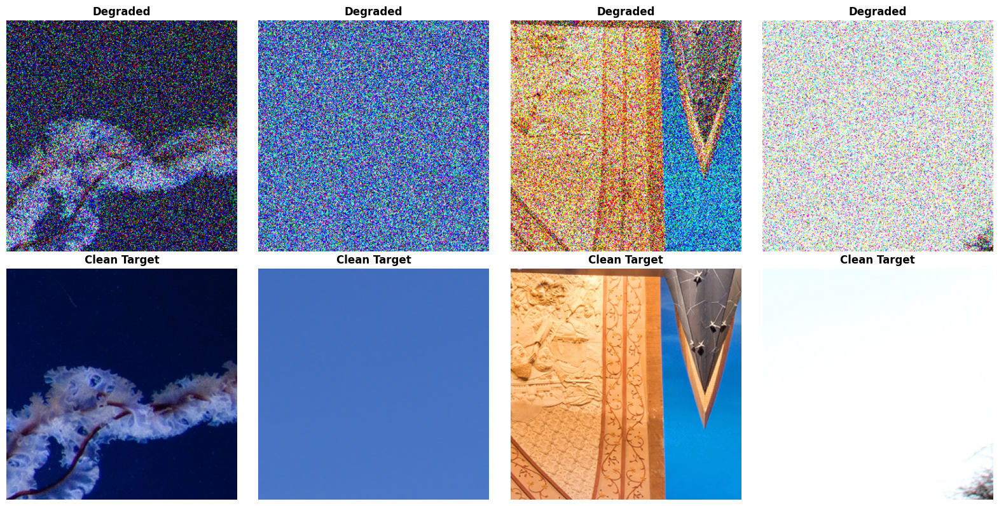


✅ Sample batch saved to c:\Development\Deep Learning\Progetto 1\Image-Enhancement\experiments\pix2pix\gaussian\20260103_163829\samples\training_samples.png


In [8]:
# Visualize a batch
degraded_batch, clean_batch = next(iter(train_loader))

print("📸 Batch shapes:")
print(f"   Degraded: {degraded_batch.shape}")
print(f"   Clean: {clean_batch.shape}")
print(f"   Range: [{degraded_batch.min():.3f}, {degraded_batch.max():.3f}]")

# Show sample using utility function
plot_image_comparison(
    degraded_batch=degraded_batch,
    clean_batch=clean_batch,
    n_samples=4,
    save_path=samples_dir / "training_samples.png",
)

print(f"\n✅ Sample batch saved to {samples_dir / 'training_samples.png'}")

## 9. Initialize Models

**Generator:** UNet-based with skip connections (encoder-decoder)
**Discriminator:** PatchGAN with 70×70 receptive field

In [9]:
# Create Generator (UNet-based)
generator = Pix2PixGenerator(
    in_channels=3,
    out_channels=3,
    features=config["generator_features"]
).to(config["device"])

print("\n🎨 Generator: Pix2Pix UNet")
print(f"   Architecture: Encoder-Decoder with skip connections")
print(f"   Features: {config['generator_features']}")
print(f"   Parameters: {generator.get_num_params():,}")
print(f"   Device: {config['device']}")

# Create Discriminator (PatchGAN)
discriminator = PatchGANDiscriminator(
    in_channels=6,  # 3 (condition) + 3 (target)
    features=config["discriminator_features"]
).to(config["device"])

print("\n🔍 Discriminator: PatchGAN")
print(f"   Receptive field: 70×70 patches")
print(f"   Input: Concatenation [condition | target]")
print(f"   Features: {config['discriminator_features']}")
print(f"   Parameters: {discriminator.get_num_params():,}")
print(f"   Device: {config['device']}")

print(f"\n📊 Total parameters: {generator.get_num_params() + discriminator.get_num_params():,}")


🎨 Generator: Pix2Pix UNet
   Architecture: Encoder-Decoder with skip connections
   Features: 64
   Parameters: 41,828,995
   Device: cuda

🔍 Discriminator: PatchGAN
   Receptive field: 70×70 patches
   Input: Concatenation [condition | target]
   Features: 64
   Parameters: 2,768,641
   Device: cuda

📊 Total parameters: 44,597,636


## 10. Initialize Loss Functions and Optimizers

In [10]:
# Loss functions
criterion_GAN = nn.BCEWithLogitsLoss().to(config["device"])  # Adversarial loss (AMP-safe)
criterion_L1 = nn.L1Loss().to(config["device"])    # Reconstruction loss

print("\n📉 Loss Functions:")
print(f"   Adversarial: BCEWithLogitsLoss (combines sigmoid + BCE, AMP-safe)")
print(f"   Reconstruction: L1Loss (Mean Absolute Error)")
print(f"   Lambda L1: {config['lambda_L1']} (weight for reconstruction)")

# Optimizers (separate for G and D)
optimizer_G = optim.Adam(
    generator.parameters(),
    lr=config["learning_rate_G"],
    betas=(config["beta1"], config["beta2"])
)

optimizer_D = optim.Adam(
    discriminator.parameters(),
    lr=config["learning_rate_D"],
    betas=(config["beta1"], config["beta2"])
)

print("\n⚙️  Optimizers:")
print(f"   Generator: Adam(lr={config['learning_rate_G']}, β₁={config['beta1']}, β₂={config['beta2']})")
print(f"   Discriminator: Adam(lr={config['learning_rate_D']}, β₁={config['beta1']}, β₂={config['beta2']})")

# Learning rate schedulers (optional)
scheduler_G = optim.lr_scheduler.StepLR(optimizer_G, step_size=50, gamma=0.5)
scheduler_D = optim.lr_scheduler.StepLR(optimizer_D, step_size=50, gamma=0.5)

print("\n📅 Schedulers:")
print(f"   StepLR: Decay by 0.5 every 50 epochs")

# Gradient scalers for mixed precision
scaler_G = GradScaler() if config["use_amp"] else None
scaler_D = GradScaler() if config["use_amp"] else None

if config["use_amp"]:
    print("\n⚡ Mixed Precision: Enabled (AMP)")



📉 Loss Functions:
   Adversarial: BCEWithLogitsLoss (combines sigmoid + BCE, AMP-safe)
   Reconstruction: L1Loss (Mean Absolute Error)
   Lambda L1: 100.0 (weight for reconstruction)

⚙️  Optimizers:
   Generator: Adam(lr=0.0002, β₁=0.5, β₂=0.999)
   Discriminator: Adam(lr=0.0002, β₁=0.5, β₂=0.999)

📅 Schedulers:
   StepLR: Decay by 0.5 every 50 epochs

⚡ Mixed Precision: Enabled (AMP)


## 10b. Resume Training (if enabled)

In [11]:
# Initialize training state
start_epoch = 0
initial_best_loss_G = float("inf")
initial_best_epoch = 0
initial_history = None

if config["resume_from_checkpoint"]:
    # For Pix2Pix, we need to manually load both generator and discriminator
    # (load_checkpoint() is designed for single-model checkpoints)
    checkpoint_path = checkpoints_dir / "best_model.pth"
    
    if not checkpoint_path.exists():
        raise FileNotFoundError(f"Checkpoint not found: {checkpoint_path}")
    
    print(f"\n🔄 Resuming from checkpoint: {checkpoint_path}")
    
    # Load checkpoint
    checkpoint = torch.load(checkpoint_path, map_location=config["device"])
    
    # Load generator
    generator.load_state_dict(checkpoint["generator_state_dict"])
    optimizer_G.load_state_dict(checkpoint["optimizer_G_state_dict"])
    scheduler_G.load_state_dict(checkpoint["scheduler_G_state_dict"])
    print("   ✓ Generator state loaded")
    
    # Load discriminator
    if "discriminator_state_dict" in checkpoint:
        discriminator.load_state_dict(checkpoint["discriminator_state_dict"])
        optimizer_D.load_state_dict(checkpoint["optimizer_D_state_dict"])
        scheduler_D.load_state_dict(checkpoint["scheduler_D_state_dict"])
        print("   ✓ Discriminator state loaded")
    
    # Load scalers if using AMP
    if config["use_amp"] and "scaler_G_state_dict" in checkpoint and checkpoint["scaler_G_state_dict"] is not None:
        scaler_G.load_state_dict(checkpoint["scaler_G_state_dict"])
        scaler_D.load_state_dict(checkpoint["scaler_D_state_dict"])
        print("   ✓ Gradient scalers loaded")
    
    # Extract training state
    start_epoch = checkpoint["epoch"]
    initial_best_epoch = checkpoint["epoch"]
    
    # Handle both old and new checkpoint formats
    if "metrics" in checkpoint:
        # New format: nested metrics structure
        initial_best_loss_G = checkpoint["metrics"].get("val", {}).get("loss_G", float("inf"))
    elif "val_loss_G" in checkpoint:
        # Old format: flat structure
        initial_best_loss_G = checkpoint["val_loss_G"]
    else:
        initial_best_loss_G = float("inf")
    
    # Load history
    history_path = exp_dir / "history.json"
    if history_path.exists():
        with open(history_path, "r") as f:
            initial_history = json.load(f)
        print(f"   ✓ History loaded: {len(initial_history['train_loss_G'])} epochs")
    
    print(f"\n✅ Resume successful:")
    print(f"   Experiment: {exp_dir.name}")
    print(f"   Starting epoch: {start_epoch + 1}")
    print(f"   Best val loss G: {initial_best_loss_G:.6f}")
    print(f"   Best epoch: {initial_best_epoch}")
else:
    print("\n🆕 Starting fresh training (resume_from_checkpoint=False)")


🆕 Starting fresh training (resume_from_checkpoint=False)


## 11. Training Loop

Alternating training:
1. **Train Discriminator:** Distinguish real pairs (x, y) from fake pairs (x, G(x))
2. **Train Generator:** Fool discriminator + minimize L1 loss

In [13]:
if not SKIP_TRAINING:
    # Training history (use initial_history if resuming)
    if initial_history is not None:
        history = initial_history
        print(f"\n📋 Continuing from existing history ({len(history['train_loss_G'])} epochs)")
    else:
        history = {
            'train_loss_G': [],
            'train_loss_G_GAN': [],
            'train_loss_G_L1': [],
            'train_loss_D': [],
            'train_loss_D_real': [],
            'train_loss_D_fake': [],
            'val_loss_G': [],
            'val_loss_G_GAN': [],
            'val_loss_G_L1': [],
            'val_loss_D': [],
            'val_ssim': [],
            'lr_G': [],
            'lr_D': [],
        }
    
    best_val_loss_G = initial_best_loss_G
    best_epoch = initial_best_epoch
    patience_counter = 0
    
    # Telegram: Send training start notification
    if telegram_config["notify_every"] > 0:
        from src.utils.telegram_notifier import send_telegram_message, format_training_start_message
        msg = format_training_start_message(
            model_name=telegram_config["model_name"],
            config=config,
            experiment_name=exp_dir.name,
            total_params=generator.get_num_params() + discriminator.get_num_params(),
            resume_from_epoch=start_epoch,
            degradation_info=telegram_config["degradation_info"],
        )
        send_telegram_message(msg)
    
    print("\n" + "=" * 80)
    print("🚀 STARTING PIX2PIX GAN TRAINING")
    print("=" * 80)
    print(f"   Total epochs: {config['num_epochs']}")
    print(f"   Starting epoch: {start_epoch + 1}")
    print(f"   Batch size: {config['batch_size']}")
    print(f"   Patience: {config['patience']}")
    if initial_best_loss_G < float('inf'):
        print(f"   Resuming from best val loss G: {initial_best_loss_G:.4f}")
    print("=" * 80 + "\n")
    
    # Training loop
    for epoch in range(start_epoch + 1, config['num_epochs'] + 1):
        print(f"\n{'='*80}")
        print(f"Epoch {epoch}/{config['num_epochs']}")
        print(f"{'='*80}")
        
        # Train
        train_metrics = train_epoch_pix2pix(
            generator=generator,
            discriminator=discriminator,
            train_loader=train_loader,
            criterion_GAN=criterion_GAN,
            criterion_L1=criterion_L1,
            optimizer_G=optimizer_G,
            optimizer_D=optimizer_D,
            device=config['device'],
            lambda_L1=config['lambda_L1'],
            use_amp=config['use_amp'],
            scaler_G=scaler_G,
            scaler_D=scaler_D,
        )
        
        # Validate
        if epoch % config['val_every'] == 0:
            val_metrics = validate_pix2pix(
                generator=generator,
                discriminator=discriminator,
                val_loader=val_loader,
                criterion_GAN=criterion_GAN,
                criterion_L1=criterion_L1,
                device=config['device'],
                lambda_L1=config['lambda_L1'],
            )
            
            # Calculate SSIM manually (without torchmetrics)
            from skimage.metrics import structural_similarity as ssim
            ssim_values = []
            generator.eval()
            with torch.no_grad():
                for degraded, clean in val_loader:
                    degraded = degraded.to(config['device'])
                    clean = clean.to(config['device'])
                    restored = generator(degraded)
                    
                    # Convert to numpy and calculate SSIM per image in batch
                    restored_np = restored.cpu().numpy()
                    clean_np = clean.cpu().numpy()
                    
                    for i in range(restored_np.shape[0]):
                        # Transpose from (C, H, W) to (H, W, C) for skimage
                        img_restored = restored_np[i].transpose(1, 2, 0)
                        img_clean = clean_np[i].transpose(1, 2, 0)
                        
                        # Calculate SSIM (data_range=1.0 since images are normalized)
                        ssim_val = ssim(img_clean, img_restored, data_range=1.0, channel_axis=2)
                        ssim_values.append(ssim_val)
            
            val_metrics['ssim'] = sum(ssim_values) / len(ssim_values)
        else:
            val_metrics = {k: 0.0 for k in ['loss_G', 'loss_G_GAN', 'loss_G_L1', 'loss_D', 'ssim']}
        
        # Update learning rate
        scheduler_G.step()
        scheduler_D.step()
        
        # Store metrics
        history['train_loss_G'].append(float(train_metrics['loss_G']))
        history['train_loss_G_GAN'].append(float(train_metrics['loss_G_GAN']))
        history['train_loss_G_L1'].append(float(train_metrics['loss_G_L1']))
        history['train_loss_D'].append(float(train_metrics['loss_D']))
        history['train_loss_D_real'].append(float(train_metrics['loss_D_real']))
        history['train_loss_D_fake'].append(float(train_metrics['loss_D_fake']))
        history['val_loss_G'].append(float(val_metrics['loss_G']))
        history['val_loss_G_GAN'].append(float(val_metrics['loss_G_GAN']))
        history['val_loss_G_L1'].append(float(val_metrics['loss_G_L1']))
        history['val_loss_D'].append(float(val_metrics['loss_D']))
        history['val_ssim'].append(float(val_metrics.get('ssim', 0.0)))
        history['lr_G'].append(float(optimizer_G.param_groups[0]['lr']))
        history['lr_D'].append(float(optimizer_D.param_groups[0]['lr']))
        
        # Print epoch summary
        print(f"\n📊 Epoch {epoch} Summary:")
        print(f"   Train - G: {train_metrics['loss_G']:.4f} (GAN: {train_metrics['loss_G_GAN']:.4f}, L1: {train_metrics['loss_G_L1']:.4f})")
        print(f"   Train - D: {train_metrics['loss_D']:.4f} (Real: {train_metrics['loss_D_real']:.4f}, Fake: {train_metrics['loss_D_fake']:.4f})")
        if epoch % config['val_every'] == 0:
            print(f"   Val   - G: {val_metrics['loss_G']:.4f} (GAN: {val_metrics['loss_G_GAN']:.4f}, L1: {val_metrics['loss_G_L1']:.4f})")
            print(f"   Val SSIM: {val_metrics['ssim']:.4f}")
        print(f"   LR - G: {optimizer_G.param_groups[0]['lr']:.6f}, D: {optimizer_D.param_groups[0]['lr']:.6f}")
        
        # Telegram: Send epoch update
        if telegram_config["notify_every"] > 0 and epoch % telegram_config["notify_every"] == 0:
            from src.utils.telegram_notifier import format_epoch_message
            msg = format_epoch_message(
                epoch=epoch,
                total_epochs=config["num_epochs"],
                train_loss=train_metrics['loss_G'],
                val_loss=val_metrics['loss_G'] if epoch % config['val_every'] == 0 else None,
                learning_rate=optimizer_G.param_groups[0]['lr'],
                additional_metrics={
                    "Train Loss D": train_metrics['loss_D'],
                    "Train Loss G L1": train_metrics['loss_G_L1'],
                    "Val Loss D": val_metrics['loss_D'] if epoch % config['val_every'] == 0 else None,
                }
            )
            send_telegram_message(msg)
        
        # TensorBoard logging
        writer.add_scalar('Train/Loss_G', train_metrics['loss_G'], epoch)
        writer.add_scalar('Train/Loss_G_GAN', train_metrics['loss_G_GAN'], epoch)
        writer.add_scalar('Train/Loss_G_L1', train_metrics['loss_G_L1'], epoch)
        writer.add_scalar('Train/Loss_D', train_metrics['loss_D'], epoch)
        writer.add_scalar('Val/Loss_G', val_metrics['loss_G'], epoch)
        writer.add_scalar('Val/SSIM', val_metrics.get('ssim', 0.0), epoch)
        writer.add_scalar('Learning_Rate/Generator', optimizer_G.param_groups[0]['lr'], epoch)
        writer.add_scalar('Learning_Rate/Discriminator', optimizer_D.param_groups[0]['lr'], epoch)
        
        # Save best model
        if epoch % config['val_every'] == 0 and val_metrics['loss_G'] < best_val_loss_G:
            best_val_loss_G = val_metrics['loss_G']
            best_epoch = epoch
            patience_counter = 0
            
            checkpoint = {
                'epoch': epoch,
                'generator_state_dict': generator.state_dict(),
                'discriminator_state_dict': discriminator.state_dict(),
                'optimizer_G_state_dict': optimizer_G.state_dict(),
                'optimizer_D_state_dict': optimizer_D.state_dict(),
                'scheduler_G_state_dict': scheduler_G.state_dict(),
                'scheduler_D_state_dict': scheduler_D.state_dict(),
                'scaler_G_state_dict': scaler_G.state_dict() if config['use_amp'] else None,
                'scaler_D_state_dict': scaler_D.state_dict() if config['use_amp'] else None,
                'metrics': {
                    'train': {
                        'loss_G': train_metrics['loss_G'],
                        'loss_D': train_metrics['loss_D'],
                    },
                    'val': {
                        'loss_G': val_metrics['loss_G'],
                        'loss_D': val_metrics['loss_D'],
                    }
                },
                'config': config,
            }
            torch.save(checkpoint, checkpoints_dir / "best_model.pth")
            print(f"   💾 Best model saved! (Val Loss G: {best_val_loss_G:.4f})")
        else:
            patience_counter += 1
        
        # Save periodic checkpoint
        if epoch % config['save_every'] == 0:
            checkpoint = {
                'epoch': epoch,
                'generator_state_dict': generator.state_dict(),
                'discriminator_state_dict': discriminator.state_dict(),
                'optimizer_G_state_dict': optimizer_G.state_dict(),
                'optimizer_D_state_dict': optimizer_D.state_dict(),
                'scheduler_G_state_dict': scheduler_G.state_dict(),
                'scheduler_D_state_dict': scheduler_D.state_dict(),
                'scaler_G_state_dict': scaler_G.state_dict() if config['use_amp'] else None,
                'scaler_D_state_dict': scaler_D.state_dict() if config['use_amp'] else None,
                'metrics': {
                    'train': {
                        'loss_G': train_metrics['loss_G'],
                        'loss_D': train_metrics['loss_D'],
                    },
                    'val': {
                        'loss_G': val_metrics['loss_G'],
                        'loss_D': val_metrics['loss_D'],
                    }
                },
                'config': config,
            }
            torch.save(checkpoint, checkpoints_dir / f"checkpoint_epoch_{epoch:03d}.pth")
            print(f"   💾 Checkpoint saved: epoch_{epoch:03d}.pth")
        
        # Save history
        with open(exp_dir / 'history.json', 'w') as f:
            json.dump(history, f, indent=4)
        
        # Early stopping
        if patience_counter >= config['patience']:
            print(f"\n⏹️  Early stopping triggered! No improvement for {config['patience']} epochs.")
            break
    
    # Telegram: Send training completion notification
    if telegram_config["notify_every"] > 0:
        from src.utils.telegram_notifier import format_training_complete_message
        msg = format_training_complete_message(
            model_name=telegram_config["model_name"],
            total_epochs=epoch,
            best_epoch=best_epoch,
            best_val_loss=best_val_loss_G,
            final_train_loss=train_metrics['loss_G'],
        )
        send_telegram_message(msg)
    
    print("\n" + "=" * 80)
    print("✅ TRAINING COMPLETED")
    print("=" * 80)
    print(f"   Best epoch: {best_epoch}")
    print(f"   Best val loss G: {best_val_loss_G:.4f}")
    print(f"   Total epochs: {epoch}")
    print("=" * 80 + "\n")
    
else:
    # Skip training: Load existing history
    print("\n" + "=" * 80)
    print("⏭️  SKIP_TRAINING = True: Loading existing results")
    print("=" * 80 + "\n")
    
    from src.utils.experiment import load_training_history
    
    try:
        history = load_training_history(exp_dir)
        print(f"✅ Loaded history from {exp_dir / 'history.json'}")
        print(f"   Total epochs: {len(history['train_loss_G'])}")
        
        if history.get('val_loss_G'):
            best_val_loss_G = min([x for x in history['val_loss_G'] if x > 0])
            best_epoch = [i+1 for i, x in enumerate(history['val_loss_G']) if x == best_val_loss_G][0]
            print(f"   Best epoch: {best_epoch} (val_loss_G: {best_val_loss_G:.4f})")
        else:
            best_val_loss_G = float('inf')
            best_epoch = 0
            
        # Load best checkpoint
        checkpoint_path = checkpoints_dir / "best_model.pth"
        if checkpoint_path.exists():
            checkpoint = torch.load(checkpoint_path, map_location=config['device'])
            generator.load_state_dict(checkpoint['generator_state_dict'])
            discriminator.load_state_dict(checkpoint['discriminator_state_dict'])
            print(f"✅ Loaded best model checkpoint from epoch {checkpoint['epoch']}")
    except FileNotFoundError:
        print(f"⚠️  No history found in {exp_dir}")
        history = {}
        best_epoch = 0
        best_val_loss_G = float('inf')


🚀 STARTING PIX2PIX GAN TRAINING
   Total epochs: 100
   Starting epoch: 1
   Batch size: 16
   Patience: 7


Epoch 1/100



📊 Epoch 1 Summary:
   Train - G: 14.8206 (GAN: 1.3736, L1: 0.1345)
   Train - D: 0.5342 (Real: 0.5400, Fake: 0.5284)
   Val   - G: 13.3279 (GAN: 0.7954, L1: 0.1253)
   Val SSIM: 0.2730
   LR - G: 0.000200, D: 0.000200
   💾 Best model saved! (Val Loss G: 13.3279)

Epoch 2/100



📊 Epoch 2 Summary:
   Train - G: 13.2177 (GAN: 1.1987, L1: 0.1202)
   Train - D: 0.5931 (Real: 0.6037, Fake: 0.5825)
   Val   - G: 12.8191 (GAN: 1.1724, L1: 0.1165)
   Val SSIM: 0.3039
   LR - G: 0.000200, D: 0.000200
   💾 Best model saved! (Val Loss G: 12.8191)

Epoch 3/100



📊 Epoch 3 Summary:
   Train - G: 12.6088 (GAN: 1.1843, L1: 0.1142)
   Train - D: 0.5983 (Real: 0.6157, Fake: 0.5809)
   Val   - G: 12.0028 (GAN: 0.8657, L1: 0.1114)
   Val SSIM: 0.3157
   LR - G: 0.000200, D: 0.000200
   💾 Best model saved! (Val Loss G: 12.0028)

Epoch 4/100



📊 Epoch 4 Summary:
   Train - G: 12.3852 (GAN: 1.1957, L1: 0.1119)
   Train - D: 0.5786 (Real: 0.5929, Fake: 0.5643)
   Val   - G: 12.1303 (GAN: 0.9861, L1: 0.1114)
   Val SSIM: 0.3425
   LR - G: 0.000200, D: 0.000200

Epoch 5/100



📊 Epoch 5 Summary:
   Train - G: 12.1253 (GAN: 1.1691, L1: 0.1096)
   Train - D: 0.5853 (Real: 0.6034, Fake: 0.5672)
   Val   - G: 11.3795 (GAN: 0.6422, L1: 0.1074)
   Val SSIM: 0.3691
   LR - G: 0.000200, D: 0.000200
   💾 Best model saved! (Val Loss G: 11.3795)
   💾 Checkpoint saved: epoch_005.pth

Epoch 6/100



📊 Epoch 6 Summary:
   Train - G: 11.8961 (GAN: 1.1472, L1: 0.1075)
   Train - D: 0.5830 (Real: 0.5982, Fake: 0.5677)
   Val   - G: 10.9084 (GAN: 0.8235, L1: 0.1008)
   Val SSIM: 0.3830
   LR - G: 0.000200, D: 0.000200
   💾 Best model saved! (Val Loss G: 10.9084)

Epoch 7/100



📊 Epoch 7 Summary:
   Train - G: 12.7704 (GAN: 1.8916, L1: 0.1088)
   Train - D: 0.4894 (Real: 0.4976, Fake: 0.4811)
   Val   - G: 14.8372 (GAN: 4.4477, L1: 0.1039)
   Val SSIM: 0.3869
   LR - G: 0.000200, D: 0.000200

Epoch 8/100



📊 Epoch 8 Summary:
   Train - G: 12.9627 (GAN: 2.1269, L1: 0.1084)
   Train - D: 0.3914 (Real: 0.3871, Fake: 0.3958)
   Val   - G: 11.8216 (GAN: 1.4394, L1: 0.1038)
   Val SSIM: 0.3562
   LR - G: 0.000200, D: 0.000200

Epoch 9/100



📊 Epoch 9 Summary:
   Train - G: 13.6291 (GAN: 2.5939, L1: 0.1104)
   Train - D: 0.3344 (Real: 0.3393, Fake: 0.3294)
   Val   - G: 13.7910 (GAN: 2.7854, L1: 0.1101)
   Val SSIM: 0.3619
   LR - G: 0.000200, D: 0.000200

Epoch 10/100



📊 Epoch 10 Summary:
   Train - G: 12.8370 (GAN: 2.1510, L1: 0.1069)
   Train - D: 0.4436 (Real: 0.4611, Fake: 0.4261)
   Val   - G: 11.0126 (GAN: 1.3350, L1: 0.0968)
   Val SSIM: 0.4000
   LR - G: 0.000200, D: 0.000200
   💾 Checkpoint saved: epoch_010.pth

Epoch 11/100



📊 Epoch 11 Summary:
   Train - G: 12.4051 (GAN: 1.8325, L1: 0.1057)
   Train - D: 0.4427 (Real: 0.4431, Fake: 0.4423)
   Val   - G: 13.1738 (GAN: 1.9962, L1: 0.1118)
   Val SSIM: 0.3578
   LR - G: 0.000200, D: 0.000200

Epoch 12/100



📊 Epoch 12 Summary:
   Train - G: 11.9052 (GAN: 1.6761, L1: 0.1023)
   Train - D: 0.5343 (Real: 0.5502, Fake: 0.5183)
   Val   - G: 10.4542 (GAN: 0.8561, L1: 0.0960)
   Val SSIM: 0.3960
   LR - G: 0.000200, D: 0.000200
   💾 Best model saved! (Val Loss G: 10.4542)

Epoch 13/100



📊 Epoch 13 Summary:
   Train - G: 12.6890 (GAN: 2.2126, L1: 0.1048)
   Train - D: 0.3597 (Real: 0.3578, Fake: 0.3615)
   Val   - G: 11.2927 (GAN: 1.0810, L1: 0.1021)
   Val SSIM: 0.3796
   LR - G: 0.000200, D: 0.000200

Epoch 14/100



📊 Epoch 14 Summary:
   Train - G: 12.5002 (GAN: 2.0642, L1: 0.1044)
   Train - D: 0.4606 (Real: 0.4779, Fake: 0.4433)
   Val   - G: 12.4265 (GAN: 2.1359, L1: 0.1029)
   Val SSIM: 0.3947
   LR - G: 0.000200, D: 0.000200

Epoch 15/100



📊 Epoch 15 Summary:
   Train - G: 12.3111 (GAN: 1.8852, L1: 0.1043)
   Train - D: 0.4702 (Real: 0.4753, Fake: 0.4651)
   Val   - G: 11.0740 (GAN: 0.9669, L1: 0.1011)
   Val SSIM: 0.4001
   LR - G: 0.000200, D: 0.000200
   💾 Checkpoint saved: epoch_015.pth

Epoch 16/100



📊 Epoch 16 Summary:
   Train - G: 11.8303 (GAN: 1.5732, L1: 0.1026)
   Train - D: 0.4998 (Real: 0.5119, Fake: 0.4877)
   Val   - G: 11.9734 (GAN: 1.2353, L1: 0.1074)
   Val SSIM: 0.3802
   LR - G: 0.000200, D: 0.000200

Epoch 17/100



📊 Epoch 17 Summary:
   Train - G: 12.5615 (GAN: 2.1853, L1: 0.1038)
   Train - D: 0.4171 (Real: 0.4233, Fake: 0.4108)
   Val   - G: 11.5318 (GAN: 1.8407, L1: 0.0969)
   Val SSIM: 0.4154
   LR - G: 0.000200, D: 0.000200

Epoch 18/100



📊 Epoch 18 Summary:
   Train - G: 12.3614 (GAN: 1.9320, L1: 0.1043)
   Train - D: 0.4212 (Real: 0.4279, Fake: 0.4145)
   Val   - G: 12.4506 (GAN: 1.6051, L1: 0.1085)
   Val SSIM: 0.3613
   LR - G: 0.000200, D: 0.000200

Epoch 19/100



📊 Epoch 19 Summary:
   Train - G: 12.7342 (GAN: 2.2517, L1: 0.1048)
   Train - D: 0.4084 (Real: 0.4243, Fake: 0.3925)
   Val   - G: 11.7474 (GAN: 1.8066, L1: 0.0994)
   Val SSIM: 0.3899
   LR - G: 0.000200, D: 0.000200

⏹️  Early stopping triggered! No improvement for 7 epochs.

✅ TRAINING COMPLETED
   Best epoch: 12
   Best val loss G: 10.4542
   Total epochs: 19



## 12. Plot Training Curves

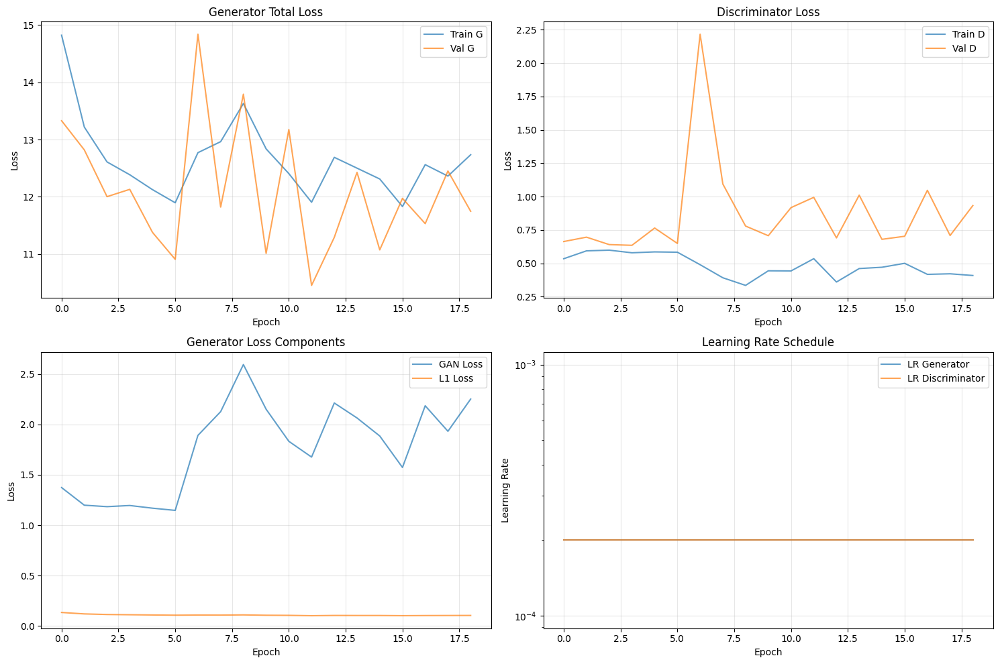


✅ Training curves saved to c:\Development\Deep Learning\Progetto 1\Image-Enhancement\experiments\pix2pix\gaussian\20260103_163829\training_curves.png


In [14]:
# Plot training curves
if history:
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))
    
    # Generator loss
    axes[0, 0].plot(history['train_loss_G'], label='Train G', alpha=0.7)
    axes[0, 0].plot(history['val_loss_G'], label='Val G', alpha=0.7)
    axes[0, 0].set_xlabel('Epoch')
    axes[0, 0].set_ylabel('Loss')
    axes[0, 0].set_title('Generator Total Loss')
    axes[0, 0].legend()
    axes[0, 0].grid(True, alpha=0.3)
    
    # Discriminator loss
    axes[0, 1].plot(history['train_loss_D'], label='Train D', alpha=0.7)
    axes[0, 1].plot(history['val_loss_D'], label='Val D', alpha=0.7)
    axes[0, 1].set_xlabel('Epoch')
    axes[0, 1].set_ylabel('Loss')
    axes[0, 1].set_title('Discriminator Loss')
    axes[0, 1].legend()
    axes[0, 1].grid(True, alpha=0.3)
    
    # Generator components
    axes[1, 0].plot(history['train_loss_G_GAN'], label='GAN Loss', alpha=0.7)
    axes[1, 0].plot(history['train_loss_G_L1'], label='L1 Loss', alpha=0.7)
    axes[1, 0].set_xlabel('Epoch')
    axes[1, 0].set_ylabel('Loss')
    axes[1, 0].set_title('Generator Loss Components')
    axes[1, 0].legend()
    axes[1, 0].grid(True, alpha=0.3)
    
    # Learning rates
    axes[1, 1].plot(history['lr_G'], label='LR Generator', alpha=0.7)
    axes[1, 1].plot(history['lr_D'], label='LR Discriminator', alpha=0.7)
    axes[1, 1].set_xlabel('Epoch')
    axes[1, 1].set_ylabel('Learning Rate')
    axes[1, 1].set_title('Learning Rate Schedule')
    axes[1, 1].set_yscale('log')
    axes[1, 1].legend()
    axes[1, 1].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.savefig(exp_dir / 'training_curves.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    print(f"\n✅ Training curves saved to {exp_dir / 'training_curves.png'}")

## 13. Test Inference on Validation Samples

✅ Loaded best model from epoch 12
   Val Loss G: 10.4542


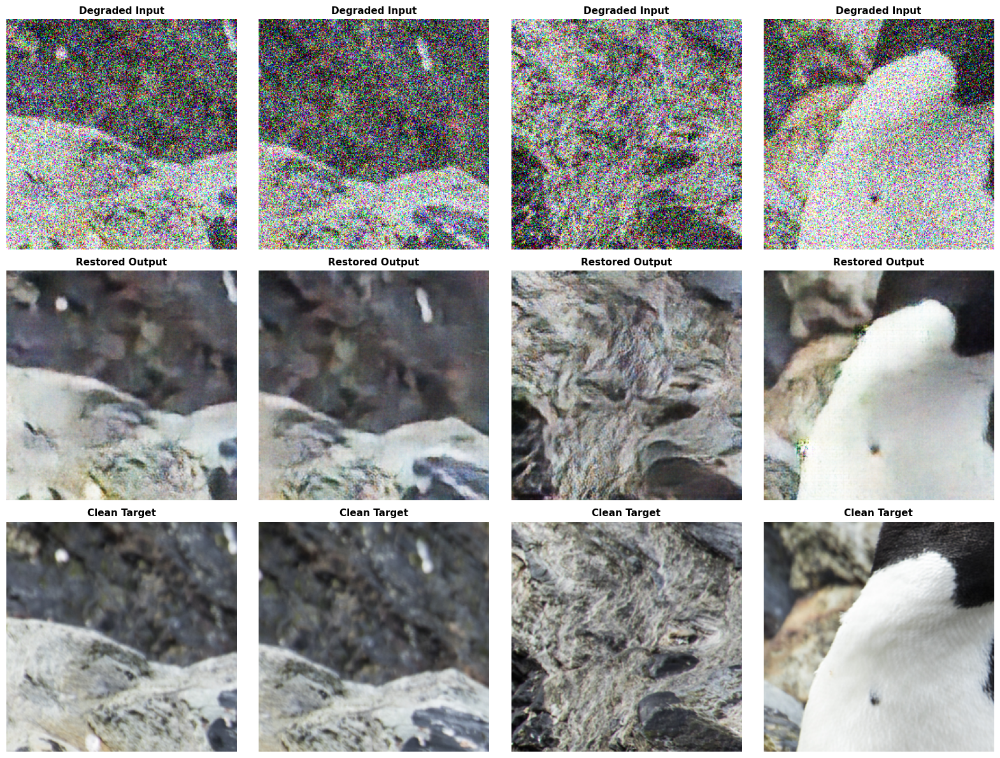


✅ Inference results saved to c:\Development\Deep Learning\Progetto 1\Image-Enhancement\experiments\pix2pix\gaussian\20260103_163829\samples\inference_results.png


In [15]:
# Load best model
checkpoint = torch.load(checkpoints_dir / "best_model.pth", map_location=config['device'])
generator.load_state_dict(checkpoint['generator_state_dict'])
discriminator.load_state_dict(checkpoint['discriminator_state_dict'])

print(f"✅ Loaded best model from epoch {checkpoint['epoch']}")

# Handle both old and new checkpoint formats
if "metrics" in checkpoint:
    val_loss_g = checkpoint["metrics"].get("val", {}).get("loss_G", "N/A")
elif "val_loss_G" in checkpoint:
    val_loss_g = checkpoint["val_loss_G"]
else:
    val_loss_g = "N/A"

if val_loss_g != "N/A":
    print(f"   Val Loss G: {val_loss_g:.4f}")
else:
    print(f"   Val Loss G: N/A")

# Get validation batch
degraded_batch, clean_batch = next(iter(val_loader))
degraded_batch = degraded_batch.to(config["device"])
clean_batch = clean_batch.to(config["device"])

# Inference
generator.eval()
with torch.no_grad():
    restored_batch = generator(degraded_batch)

# Visualize results
plot_inference_results(
    degraded_batch=degraded_batch,
    restored_batch=restored_batch,
    clean_batch=clean_batch,
    n_samples=4,
    save_path=samples_dir / "inference_results.png",
)

print(f"\n✅ Inference results saved to {samples_dir / 'inference_results.png'}")

## 14. Quantitative Evaluation on Full-Resolution Images

Evaluate the generator on entire validation images using sliding window inference.

In [16]:
# Create evaluator (use generator only)
evaluator = ImageRestorationEvaluator(
    model=generator,
    device=config["device"],
    patch_size=config["patch_size"],
    overlap=64,  # Larger overlap for smoother blending
)

print("\n🔍 Evaluator configured:")
print(f"   Model: Pix2Pix Generator")
print(f"   Patch size: {config['patch_size']}")
print("   Overlap: 64 pixels")
print(f"   Device: {config['device']}")


🔍 Evaluator configured:
   Model: Pix2Pix Generator
   Patch size: 256
   Overlap: 64 pixels
   Device: cuda


In [17]:
# Evaluate on validation set (limit to 10 images for speed)
eval_results = evaluator.evaluate_dataset(
    degraded_dir=config["val_degraded_dir"],
    clean_dir=config["val_clean_dir"],
    output_dir=exp_dir / "restored_images",
    save_outputs=True,
    max_images=10,
)

# Print summary
evaluator.print_summary(eval_results)

# Save results
evaluator.save_results(eval_results, exp_dir / "evaluation_metrics.json")

print(f"\n✅ Evaluation metrics saved to {exp_dir / 'evaluation_metrics.json'}")


📊 Evaluating 10 images...


Processing images:   0%|          | 0/10 [00:00<?, ?it/s]


EVALUATION SUMMARY

📊 Evaluated 10 images

📈 Mean Metrics:
   PSNR: 23.77 ± 2.18 dB
   SSIM: 0.5840 ± 0.0660
   MAE: 0.047308 ± 0.013063
   MSE: 0.004842 ± 0.003097

🏆 Best Image (highest PSNR):
   0803.png
   PSNR: 27.04 dB, SSIM: 0.6674

⚠️  Worst Image (lowest PSNR):
   0807.png
   PSNR: 18.69 dB, SSIM: 0.4213


✅ Results saved to c:\Development\Deep Learning\Progetto 1\Image-Enhancement\experiments\pix2pix\gaussian\20260103_163829\evaluation_metrics.json

✅ Evaluation metrics saved to c:\Development\Deep Learning\Progetto 1\Image-Enhancement\experiments\pix2pix\gaussian\20260103_163829\evaluation_metrics.json


## 15. Visualize Full-Resolution Restoration


🏆 Best result: 0803.png
   PSNR: 27.04 dB, SSIM: 0.6674


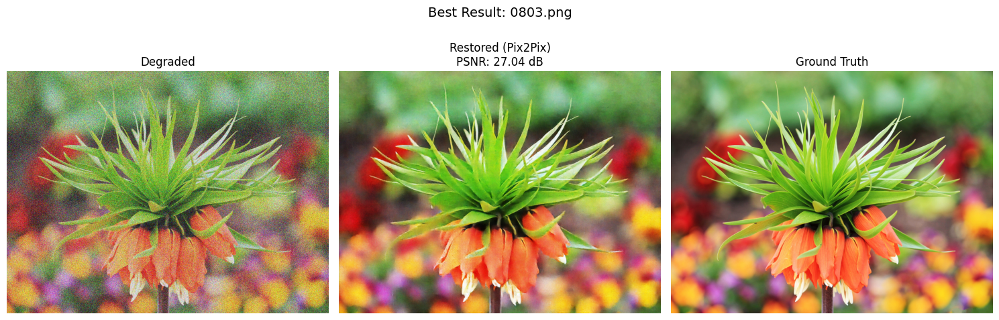


⚠️ Worst result: 0807.png
   PSNR: 18.69 dB, SSIM: 0.4213


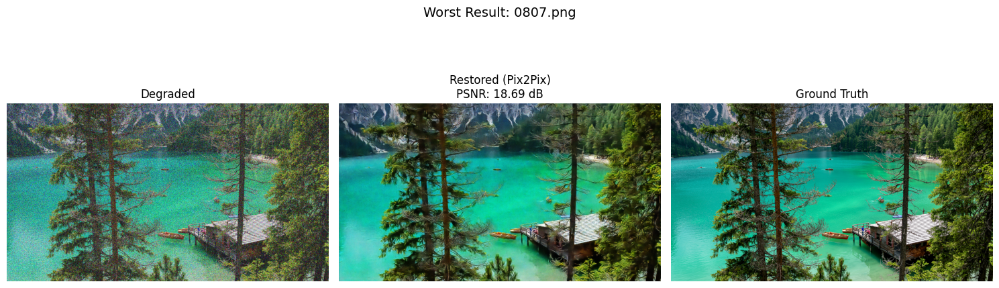

In [18]:
# Get best and worst images
if eval_results['per_image']:
    best_img = max(eval_results["per_image"], key=lambda x: x["psnr"])
    worst_img = min(eval_results["per_image"], key=lambda x: x["psnr"])

    def load_image_trio(filename):
        degraded_path = Path(config["val_degraded_dir"]) / filename
        clean_path = Path(config["val_clean_dir"]) / filename
        restored_path = exp_dir / "restored_images" / filename

        degraded = cv2.cvtColor(cv2.imread(str(degraded_path)), cv2.COLOR_BGR2RGB)
        clean = cv2.cvtColor(cv2.imread(str(clean_path)), cv2.COLOR_BGR2RGB)
        restored = cv2.cvtColor(cv2.imread(str(restored_path)), cv2.COLOR_BGR2RGB)

        return degraded, restored, clean

    # Visualize best result
    print(f"\n🏆 Best result: {best_img['filename']}")
    print(f"   PSNR: {best_img['psnr']:.2f} dB, SSIM: {best_img['ssim']:.4f}")

    deg, res, cln = load_image_trio(best_img["filename"])

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(deg)
    axes[0].set_title("Degraded")
    axes[0].axis("off")
    axes[1].imshow(res)
    axes[1].set_title(f"Restored (Pix2Pix)\nPSNR: {best_img['psnr']:.2f} dB")
    axes[1].axis("off")
    axes[2].imshow(cln)
    axes[2].set_title("Ground Truth")
    axes[2].axis("off")

    plt.suptitle(f"Best Result: {best_img['filename']}", fontsize=14, y=1.02)
    plt.tight_layout()
    plt.savefig(samples_dir / "best_full_restoration.png", dpi=150, bbox_inches="tight")
    plt.show()

    # Visualize worst result
    print(f"\n⚠️ Worst result: {worst_img['filename']}")
    print(f"   PSNR: {worst_img['psnr']:.2f} dB, SSIM: {worst_img['ssim']:.4f}")

    deg, res, cln = load_image_trio(worst_img["filename"])

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(deg)
    axes[0].set_title("Degraded")
    axes[0].axis("off")
    axes[1].imshow(res)
    axes[1].set_title(f"Restored (Pix2Pix)\nPSNR: {worst_img['psnr']:.2f} dB")
    axes[1].axis("off")
    axes[2].imshow(cln)
    axes[2].set_title("Ground Truth")
    axes[2].axis("off")

    plt.suptitle(f"Worst Result: {worst_img['filename']}", fontsize=14, y=1.02)
    plt.tight_layout()
    plt.savefig(samples_dir / "worst_full_restoration.png", dpi=150, bbox_inches="tight")
    plt.show()

## 16. Summary

**Pix2Pix GAN Training Complete!**

**Key Differences from UNet:**
- **Architecture:** Generator is UNet-based, but trained adversarially with PatchGAN discriminator
- **Loss:** Combines adversarial loss (fool discriminator) + L1 loss (pixel accuracy)
- **Training:** Alternating optimization of G and D
- **Output Quality:** Should produce sharper, more realistic details compared to pure L1/L2 training

**Expected Results:**
- Better visual quality (sharper edges, more realistic textures)
- Slightly lower PSNR/SSIM (adversarial training optimizes perceptual quality, not pixel-wise metrics)
- More stable than other GAN variants (thanks to PatchGAN + L1 loss)

**Next Steps:**
1. Compare Pix2Pix results with UNet baseline
2. Try different lambda_L1 weights (50, 100, 200)
3. Test on other degradations (dithering, blur, compression)
4. Consider ESRGAN for even better perceptual quality

In [19]:
# Print final summary
print("\n" + "=" * 80)
print("📊 PIX2PIX GAN TRAINING SUMMARY")
print("=" * 80)
print(f"\n🤖 Model:")
print(f"   Generator: {generator.get_num_params():,} parameters")
print(f"   Discriminator: {discriminator.get_num_params():,} parameters")
print(f"   Total: {generator.get_num_params() + discriminator.get_num_params():,} parameters")

if history:
    print(f"\n📈 Training:")
    print(f"   Total epochs: {len(history['train_loss_G'])}")
    print(f"   Best epoch: {best_epoch}")
    print(f"   Best val loss G: {best_val_loss_G:.4f}")
    print(f"   Final train loss G: {history['train_loss_G'][-1]:.4f}")
    print(f"   Final train loss D: {history['train_loss_D'][-1]:.4f}")

if eval_results and eval_results.get('per_image'):
    print(f"\n🎯 Evaluation (Full-Resolution):")
    print(f"   Images evaluated: {len(eval_results['per_image'])}")
    
    # Check for different possible key formats
    if 'avg_psnr' in eval_results:
        print(f"   Avg PSNR: {eval_results['avg_psnr']:.2f} dB")
        print(f"   Avg SSIM: {eval_results['avg_ssim']:.4f}")
        print(f"   Avg MAE: {eval_results['avg_mae']:.4f}")
    elif 'average' in eval_results:
        print(f"   Avg PSNR: {eval_results['average']['psnr']:.2f} dB")
        print(f"   Avg SSIM: {eval_results['average']['ssim']:.4f}")
        print(f"   Avg MAE: {eval_results['average']['mae']:.4f}")
    else:
        # Calculate manually from per_image results
        avg_psnr = sum(img['psnr'] for img in eval_results['per_image']) / len(eval_results['per_image'])
        avg_ssim = sum(img['ssim'] for img in eval_results['per_image']) / len(eval_results['per_image'])
        avg_mae = sum(img['mae'] for img in eval_results['per_image']) / len(eval_results['per_image'])
        print(f"   Avg PSNR: {avg_psnr:.2f} dB")
        print(f"   Avg SSIM: {avg_ssim:.4f}")
        print(f"   Avg MAE: {avg_mae:.4f}")

print(f"\n📁 Outputs:")
print(f"   Experiment dir: {exp_dir}")
print(f"   Best model: {checkpoints_dir / 'best_model.pth'}")
print(f"   Training curves: {exp_dir / 'training_curves.png'}")
print(f"   Evaluation: {exp_dir / 'evaluation_metrics.json'}")

print("\n" + "=" * 80)
print("✅ ALL DONE!")
print("=" * 80 + "\n")


📊 PIX2PIX GAN TRAINING SUMMARY

🤖 Model:
   Generator: 41,828,995 parameters
   Discriminator: 2,768,641 parameters
   Total: 44,597,636 parameters

📈 Training:
   Total epochs: 19
   Best epoch: 12
   Best val loss G: 10.4542
   Final train loss G: 12.7342
   Final train loss D: 0.4084

🎯 Evaluation (Full-Resolution):
   Images evaluated: 10
   Avg PSNR: 23.77 dB
   Avg SSIM: 0.5840
   Avg MAE: 0.0473

📁 Outputs:
   Experiment dir: c:\Development\Deep Learning\Progetto 1\Image-Enhancement\experiments\pix2pix\gaussian\20260103_163829
   Best model: c:\Development\Deep Learning\Progetto 1\Image-Enhancement\experiments\pix2pix\gaussian\20260103_163829\checkpoints\best_model.pth
   Training curves: c:\Development\Deep Learning\Progetto 1\Image-Enhancement\experiments\pix2pix\gaussian\20260103_163829\training_curves.png
   Evaluation: c:\Development\Deep Learning\Progetto 1\Image-Enhancement\experiments\pix2pix\gaussian\20260103_163829\evaluation_metrics.json

✅ ALL DONE!

